# Importações

In [2]:
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots as ms
import plotly.graph_objects as go

# DataFrame's

In [49]:
df_store = pd.read_excel('dataset/Superstore.xlsx')

# Separando os df por modo de envio
df_store_standard  = df_store[df_store['Ship Mode'] == 'Standard Class']
df_store_second  = df_store[df_store['Ship Mode'] == 'Second Class']
df_store_first  = df_store[df_store['Ship Mode'] == 'First Class']
df_store_sday  = df_store[df_store['Ship Mode'] == 'Same Day']

# Separando os df por região
df_store_south = df_store[df_store['Region'] == 'South']
df_store_west = df_store[df_store['Region'] == 'West']
df_store_central = df_store[df_store['Region'] == 'Central']
df_store_east = df_store[df_store['Region'] == 'East']

# Separando os df por segmento
df_store_consumer  = df_store[df_store['Segment'] == 'Consumer']
df_store_corporate  = df_store[df_store['Segment'] == 'Corporate']
df_store_hoffice  = df_store[df_store['Segment'] == 'Home Office']

# Separando os df por categoria
df_store_furniture  = df_store[df_store['Category'] == 'Furniture']
df_store_technology  = df_store[df_store['Category'] == 'Technology']
df_store_officesupli  = df_store[df_store['Category'] == 'Office Supplies']

display(df_store)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2013-138688,2013-06-13,2013-06-17,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,9990,CA-2011-110422,2011-01-22,2011-01-24,Second Class,TB-21400,Tom Boeckenhauer,Consumer,United States,Miami,...,33180,South,FUR-FU-10001889,Furniture,Furnishings,Ultra Door Pull Handle,25.2480,3,0.20,4.1028
9990,9991,CA-2014-121258,2014-02-27,2014-03-04,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,...,92627,West,FUR-FU-10000747,Furniture,Furnishings,Tenex B1-RE Series Chair Mats for Low Pile Car...,91.9600,2,0.00,15.6332
9991,9992,CA-2014-121258,2014-02-27,2014-03-04,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,...,92627,West,TEC-PH-10003645,Technology,Phones,Aastra 57i VoIP phone,258.5760,2,0.20,19.3932
9992,9993,CA-2014-121258,2014-02-27,2014-03-04,Standard Class,DB-13060,Dave Brooks,Consumer,United States,Costa Mesa,...,92627,West,OFF-PA-10004041,Office Supplies,Paper,"It's Hot Message Books with Stickers, 2 3/4"" x 5""",29.6000,4,0.00,13.3200


# Antç

1) Encontrar base de dados

-Kaggle, UCI e outros
-Tema: Negócios e Tecnologia
-Não pode: Violência, apologia

2) Estrutura

-Estrutura deve ter mais de 10000 registros
-Colunas ≥ 6
-Nominal/Ordinal ≥ 3
-Numerica ≥ 3, sendo não binaria

3) Análise geral

3.1) Histograma |
3.2) Boxplot |

4) Análise - Subgrupo (agrupar a base)

4.1) Histograma |
4.2) Boxplot |
4.3) Análise comparativa |

5) Apresentações (1 ou 2 integrantes, tendo no máximo 15 min)

-Explicações
-Detalhamento
-Gráficos


---------------------------------------------------------------

Nominal/Ordinal:
Ship Mode (B),
Customer Name (M),
Segment (B),
City (B),
State (B),
Region (B),
Category, (B)
Sub-Category (B),
Product Name (R),
 
 
Númerica:
Postal Code (M),
Sales (M),
Quantity (B),
Discount (B),
Profit (N),
Order Date (N),
Ship Date (N)
 
 
Legenda:
N = Talvez/Não Sei
B = Bom
M = Médio
R = Ruim

# 3.0

## 3.1.1

Text(0.5, 0, 'Profit')

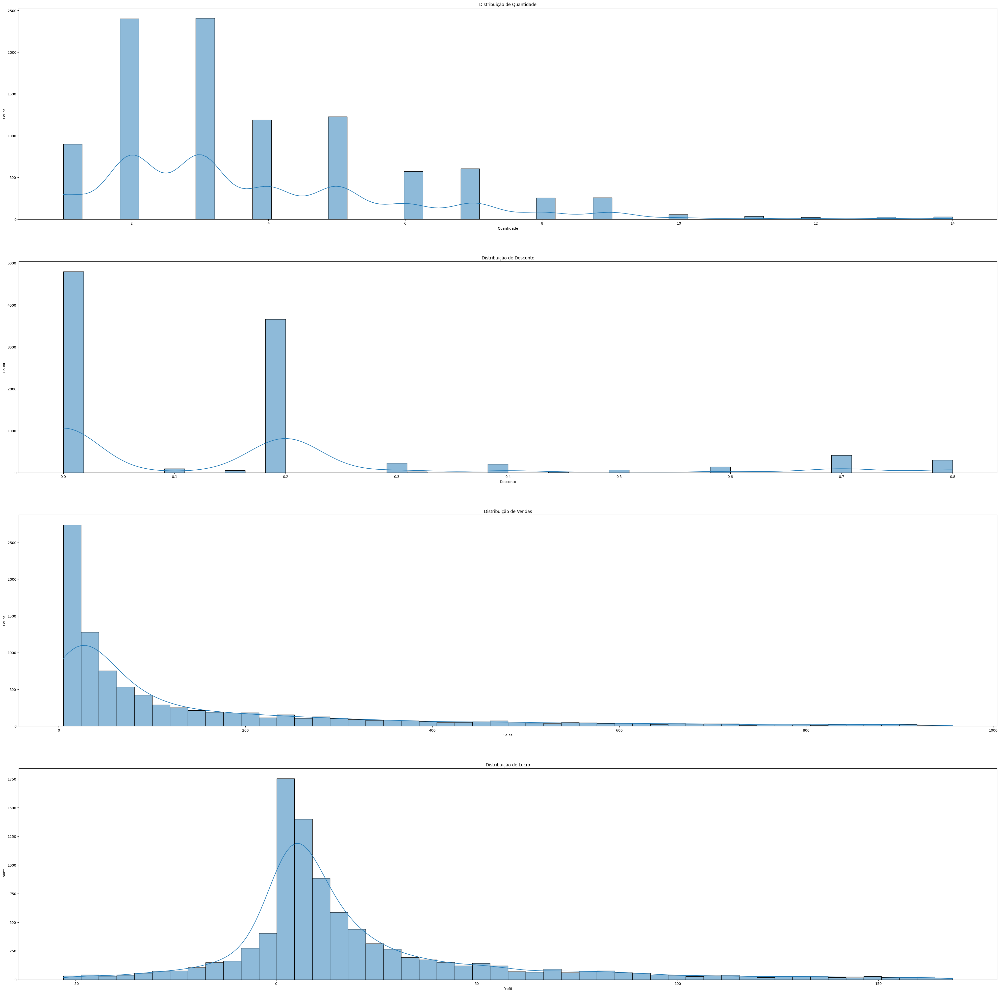

In [173]:
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]


plt.figure(figsize=(50, 50))  # Defina o tamanho do gráfico aqui (largura, altura)
plt.subplot(4, 1, 1)
sns.histplot(data=df_store, x='Quantity', multiple="stack", kde=True)
plt.title('Distribuição de Quantidade')
plt.xlabel('Quantidade')
plt.subplot(4, 1, 2)
sns.histplot(data=df_store, x='Discount', multiple="stack", kde=True)
plt.title('Distribuição de Desconto')
plt.xlabel('Desconto')
plt.subplot(4, 1, 3)
sns.histplot(data=sales_filtered, x='Sales', bins=50, kde=True)
plt.title('Distribuição de Vendas')
plt.xlabel('Sales')
plt.subplot(4, 1, 4)
sns.histplot(data=profit_filtered, x='Profit', bins=50, kde=True)
plt.title('Distribuição de Lucro')
plt.xlabel('Profit')

## 3.1.2

Text(0.5, 0, 'Quantidade')

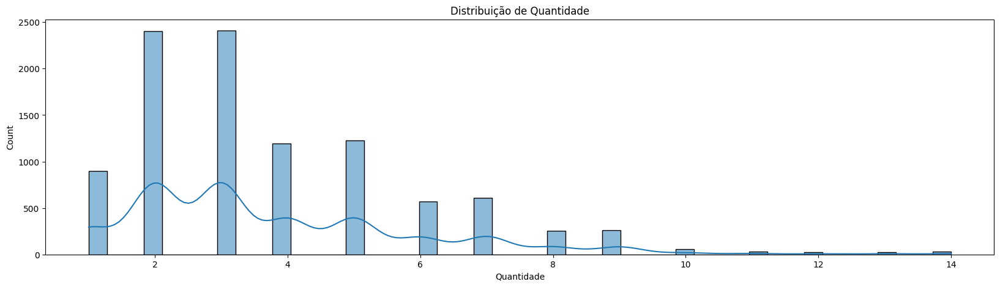

In [104]:
plt.figure(figsize=(20, 5))  # Defina o tamanho do gráfico aqui (largura, altura)
sns.histplot(data=df_store, x='Quantity', multiple="stack", kde=True)
plt.title('Distribuição de Quantidade')
plt.xlabel('Quantidade')

Text(0.5, 0, 'Desconto')

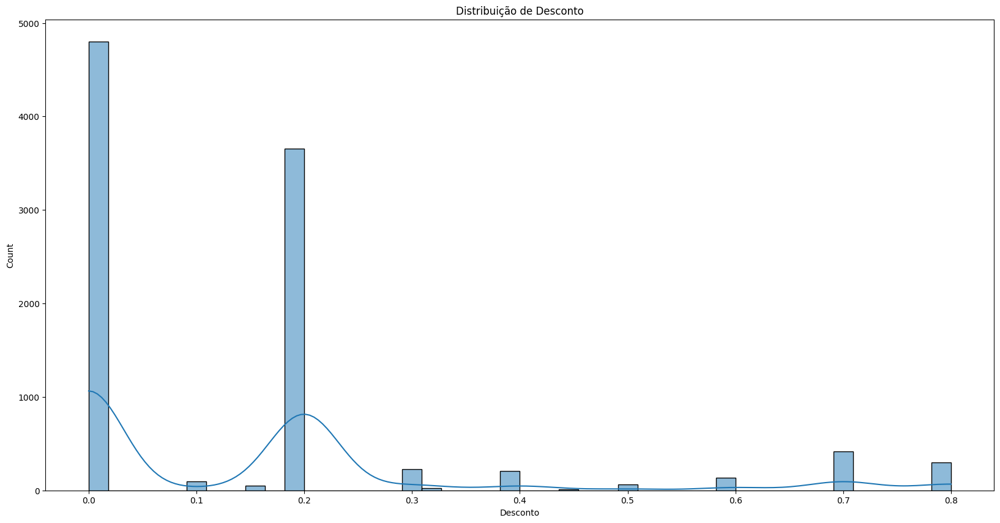

In [108]:
plt.figure(figsize=(20, 10))  # Defina o tamanho do gráfico aqui (largura, altura)
sns.histplot(data=df_store, x='Discount', multiple="stack", kde=True)
plt.title('Distribuição de Desconto')
plt.xlabel('Desconto')

In [147]:

# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", log_y=True, width=1250)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro")

# Mostrando o histograma
fig.show()


In [146]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", nbins=100, log_y=True, width=1250)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 1

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro")

# Mostrando o histograma
fig.show()


In [97]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", height=500, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 1

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas")


# Mostrando o histograma
fig.show()


In [148]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", nbins=100, height=500, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas")


# Mostrando o histograma
fig.show()


## 3.2.1

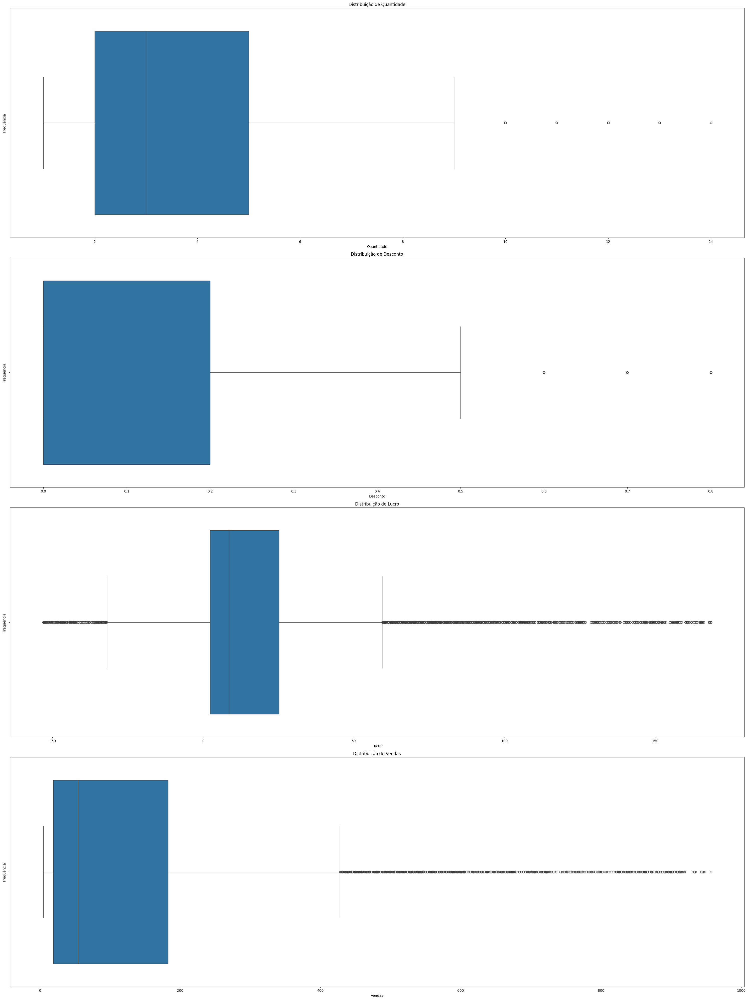

In [118]:
plt.figure(figsize=(30, 40))
plt.subplot(4, 1, 1)
sns.boxplot(data = df_store_standard, x="Quantity")
plt.title('Distribuição de Quantidade')
plt.xlabel('Quantidade')
plt.ylabel('Frequência')
plt.subplot(4, 1, 2)
sns.boxplot(data = df_store_second, x="Discount")
plt.title('Distribuição de Desconto')
plt.xlabel('Desconto')
plt.ylabel('Frequência')

# Limitando a faixa dos dados exibidos para melhorar a visualização
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.boxplot(data=profit_filtered, x="Profit")
plt.title('Distribuição de Lucro')
plt.xlabel('Lucro')
plt.ylabel('Frequência')

plt.subplot(4, 1, 4)
sns.boxplot(data=sales_filtered, x="Sales")
plt.title('Distribuição de Vendas')
plt.xlabel('Vendas')
plt.ylabel('Frequência')

plt.tight_layout()
plt.show()

## 3.2.2

In [117]:

# Criando o histograma com Plotly Express
fig = px.box(data_frame=df_store, x="Quantity")

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade")

# Mostrando o histograma
fig.show()


In [116]:

# Criando o histograma com Plotly Express
fig = px.box(data_frame=df_store, x="Discount")

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto")

# Mostrando o histograma
fig.show()


In [119]:

# Criando o histograma com Plotly Express
fig = px.box(data_frame=df_store, x="Sales")

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas")

# Mostrando o histograma
fig.show()


In [127]:
import plotly.express as px

# Criando o boxplot com Plotly Express
fig = px.box(data_frame=df_store, x="Profit")

# Ajustando o tamanho da figura
fig.update_layout(width=1200, height=600)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro")

# Mostrando o boxplot
fig.show()


# 4.0

## Region

### 4.1

#### 4.1.1.1

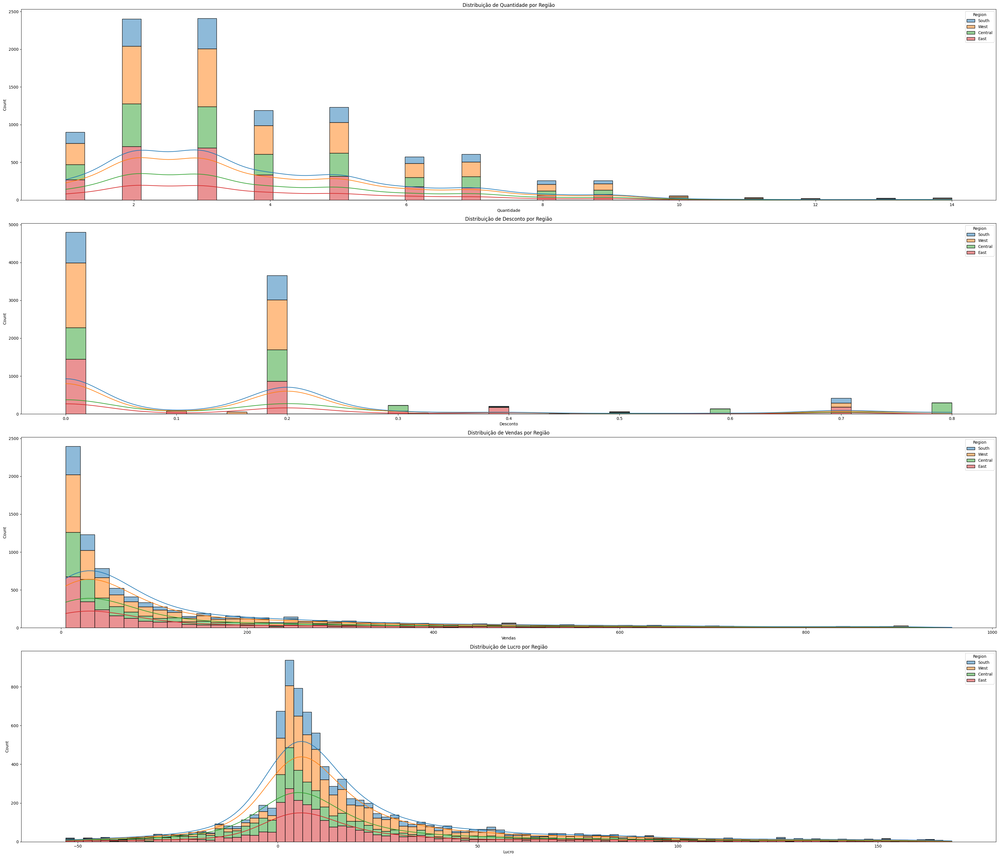

In [113]:
plt.figure(figsize=(35, 30))

plt.subplot(4, 1, 1)
sns.histplot(data=df_store, x='Quantity', hue='Region', multiple="stack", kde=True)
plt.title('Distribuição de Quantidade por Região')
plt.xlabel('Quantidade')

plt.subplot(4, 1, 2)
sns.histplot(data=df_store, x='Discount', hue='Region', multiple="stack", kde=True)
plt.title('Distribuição de Desconto por Região')
plt.xlabel('Desconto')

# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.histplot(data=sales_filtered, x='Sales', hue='Region', multiple="stack", kde=True)
plt.title('Distribuição de Vendas por Região')
plt.xlabel('Vendas')

plt.subplot(4, 1, 4)
sns.histplot(data=profit_filtered, x='Profit', hue='Region', multiple="stack", kde=True)
plt.title('Distribuição de Lucro por Região')
plt.xlabel('Lucro')

plt.tight_layout()
plt.show()


#### 4.1.1.2

In [142]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color='Region')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Região")

# Mostrando o histograma
fig.show()

In [156]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color='Region')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Região")

# Mostrando o histograma
fig.show()

In [3]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color='Region')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Região")

# Mostrando o histograma
fig.show()


In [4]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color='Region')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Região")

# Mostrando o histograma
fig.show()


#### 4.1.1.3

In [17]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color="Region", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Região")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [16]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color="Region", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Região")


# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [18]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Region", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Região")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [29]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Region", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Região")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma

fig.show()

#### 4.1.1.4

In [123]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Region", nbins=200, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [122]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Region", nbins=200, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

### 4.2

#### 4.2.1.1

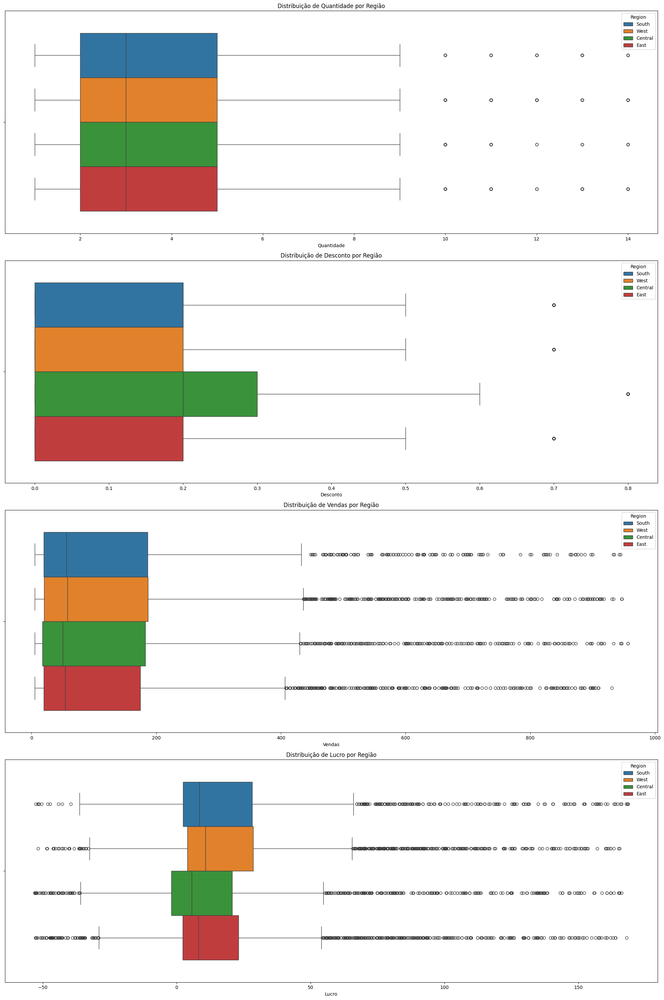

In [54]:
plt.figure(figsize=(20, 30))

plt.subplot(4, 1, 1)
sns.boxplot(data=df_store, x="Quantity", hue="Region")
plt.title('Distribuição de Quantidade por Região')
plt.xlabel('Quantidade')

plt.subplot(4, 1, 2)
sns.boxplot(data=df_store, x="Discount", hue="Region")
plt.title('Distribuição de Desconto por Região')
plt.xlabel('Desconto')

# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.boxplot(data=sales_filtered, x="Sales", hue="Region")
plt.title('Distribuição de Vendas por Região')
plt.xlabel('Vendas')

plt.subplot(4, 1, 4)
sns.boxplot(data=profit_filtered, x="Profit", hue="Region")
plt.title('Distribuição de Lucro por Região')
plt.xlabel('Lucro')

plt.tight_layout()
plt.show()


#### 4.2.1.2

In [37]:
fig = px.box(df_store, x="Quantity", color="Region")
fig.show()

In [4]:
fig = px.box(df_store, x="Discount", color="Region")
fig.show()

In [9]:
# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
fig = px.box(sales_filtered, x="Sales", color="Region")
fig.show()

In [11]:
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]
fig = px.box(profit_filtered, x="Profit", color="Region")
fig.show()

### 4.3

#### 4.3.1

Text(0.5, 0, 'Sales')

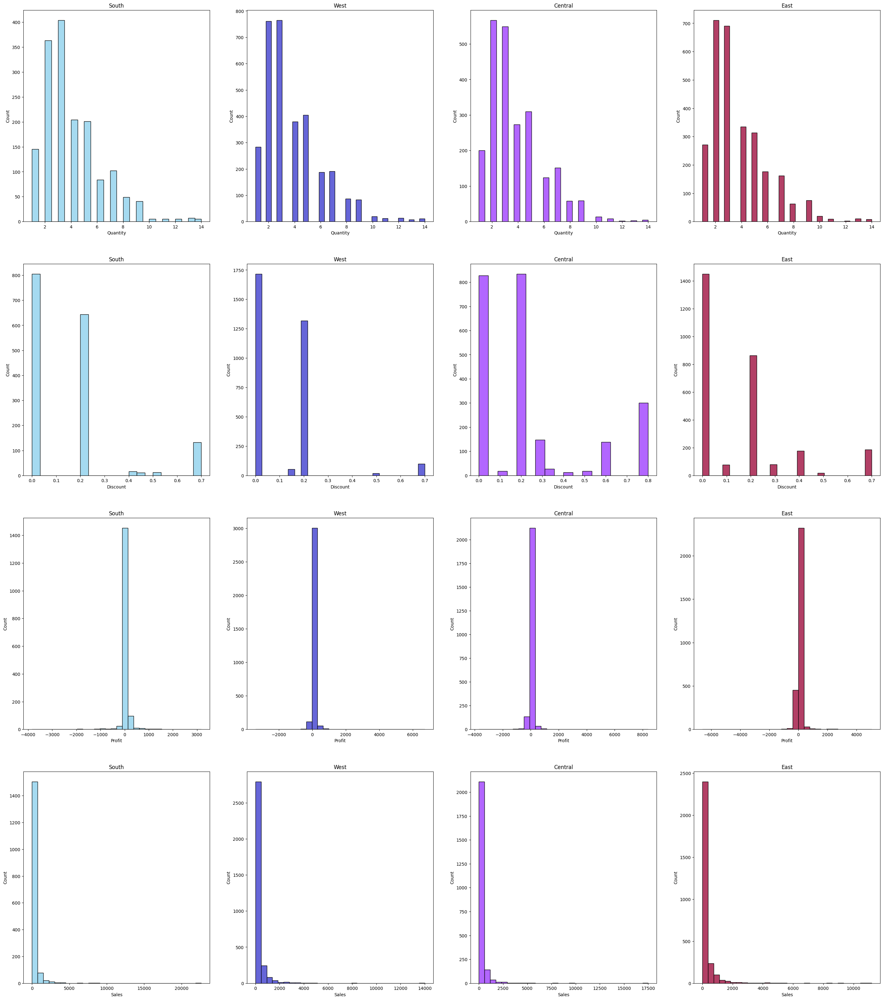

In [125]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 4, 1)
sns.histplot(df_store_south['Quantity'], color='skyblue')
plt.title('South')
plt.xlabel('Quantity')
plt.subplot(4, 4, 2)
sns.histplot(df_store_west['Quantity'], color='#33c')
plt.title('West')
plt.xlabel('Quantity')
plt.subplot(4, 4, 3)
sns.histplot(df_store_central['Quantity'], color='#93f')
plt.title('Central')
plt.xlabel('Quantity')
plt.subplot(4, 4, 4)
sns.histplot(df_store_east['Quantity'], color='#903f')
plt.title('East')
plt.xlabel('Quantity')

#linha2
plt.subplot(4, 4, 5)
sns.histplot(df_store_south['Discount'], color='skyblue')
plt.title('South')
plt.xlabel('Discount')
plt.subplot(4, 4, 6)
sns.histplot(df_store_west['Discount'], color='#33c')
plt.title('West')
plt.xlabel('Discount')
plt.subplot(4, 4, 7)
sns.histplot(df_store_central['Discount'], color='#93f')
plt.title('Central')
plt.xlabel('Discount')
plt.subplot(4, 4, 8)
sns.histplot(df_store_east['Discount'], color='#903f')
plt.title('East')
plt.xlabel('Discount')

#linha3
plt.subplot(4, 4, 9)
sns.histplot(df_store_south['Profit'], color='skyblue', bins=30)
plt.title('South')
plt.xlabel('Profit')
plt.subplot(4, 4, 10)
sns.histplot(df_store_west['Profit'], color='#33c', bins=30)
plt.title('West')
plt.xlabel('Profit')
plt.subplot(4, 4, 11)
sns.histplot(df_store_central['Profit'], color='#93f', bins=30)
plt.title('Central')
plt.xlabel('Profit')
plt.subplot(4, 4, 12)
sns.histplot(df_store_east['Profit'], color='#903f', bins=30)
plt.title('East')
plt.xlabel('Profit')

#linha4
plt.subplot(4, 4, 13)
sns.histplot(df_store_south['Sales'], color='skyblue', bins=30)
plt.title('South')
plt.xlabel('Sales')
plt.subplot(4, 4, 14)
sns.histplot(df_store_west['Sales'], color='#33c', bins=30)
plt.title('West')
plt.xlabel('Sales')
plt.subplot(4, 4, 15)
sns.histplot(df_store_central['Sales'], color='#93f', bins=30)
plt.title('Central')
plt.xlabel('Sales')
plt.subplot(4, 4, 16)
sns.histplot(df_store_east['Sales'], color='#903f', bins=30)
plt.title('East')
plt.xlabel('Sales')


#### 4.3.2

Text(0.5, 1.0, 'East')

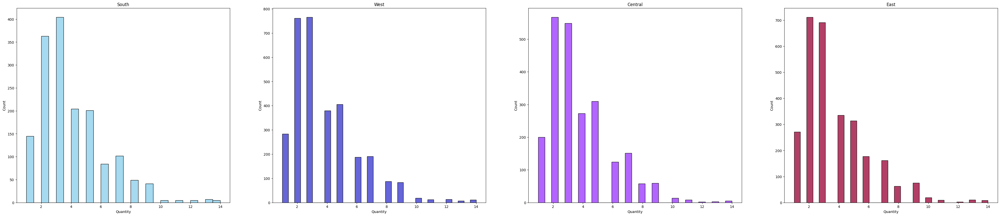

In [36]:
plt.figure(figsize=(50, 10))
plt.subplot(1, 4, 1)
sns.histplot(df_store_south['Quantity'], color='skyblue')
plt.title('South')
plt.subplot(1, 4, 2)
sns.histplot(df_store_west['Quantity'], color='#33c')
plt.title('West')
plt.subplot(1, 4, 3)
sns.histplot(df_store_central['Quantity'], color='#93f')
plt.title('Central')
plt.subplot(1, 4, 4)
sns.histplot(df_store_east['Quantity'], color='#903f')
plt.title('East')


Text(0.5, 1.0, 'East')

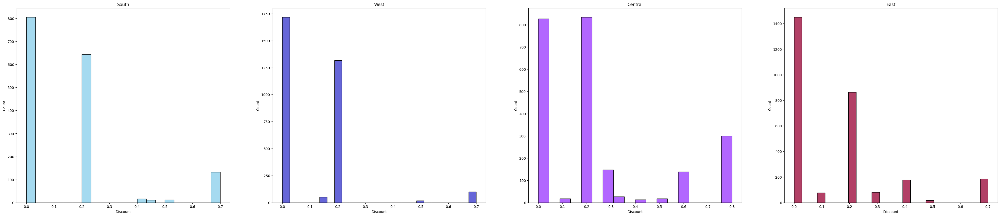

In [37]:
plt.figure(figsize=(50, 10))
plt.subplot(1, 4, 1)
sns.histplot(df_store_south['Discount'], color='skyblue')
plt.title('South')
plt.subplot(1, 4, 2)
sns.histplot(df_store_west['Discount'], color='#33c')
plt.title('West')
plt.subplot(1, 4, 3)
sns.histplot(df_store_central['Discount'], color='#93f')
plt.title('Central')
plt.subplot(1, 4, 4)
sns.histplot(df_store_east['Discount'], color='#903f')
plt.title('East')


Text(0.5, 1.0, 'East')

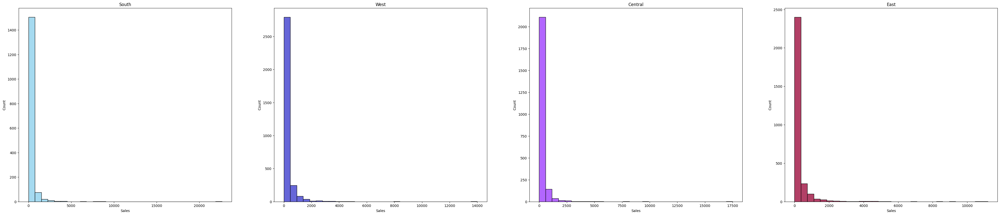

In [126]:
plt.figure(figsize=(50, 10))
plt.subplot(1, 4, 1)
sns.histplot(df_store_south['Sales'], color='skyblue', bins=30)
plt.title('South')
plt.subplot(1, 4, 2)
sns.histplot(df_store_west['Sales'], color='#33c', bins=30)
plt.title('West')
plt.subplot(1, 4, 3)
sns.histplot(df_store_central['Sales'], color='#93f', bins=30)
plt.title('Central')
plt.subplot(1, 4, 4)
sns.histplot(df_store_east['Sales'], color='#903f', bins=30)
plt.title('East')


Text(0.5, 1.0, 'East')

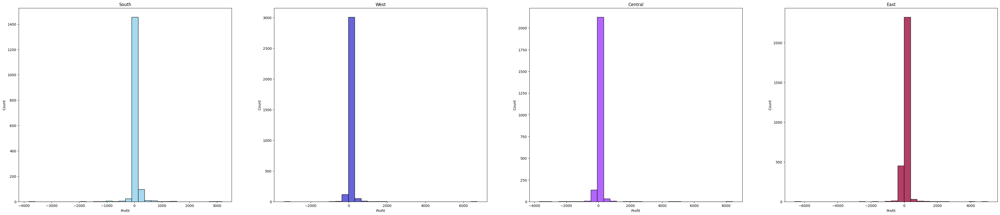

In [127]:
plt.figure(figsize=(50, 10))
plt.subplot(1, 4, 1)
sns.histplot(df_store_south['Profit'], color='skyblue', bins=30)
plt.title('South')
plt.subplot(1, 4, 2)
sns.histplot(df_store_west['Profit'], color='#33c', bins=30)
plt.title('West')
plt.subplot(1, 4, 3)
sns.histplot(df_store_central['Profit'], color='#93f', bins=30)
plt.title('Central')
plt.subplot(1, 4, 4)
sns.histplot(df_store_east['Profit'], color='#903f', bins=30)
plt.title('East')


## Ship Mode

### 4.1

#### 4.1.1.1

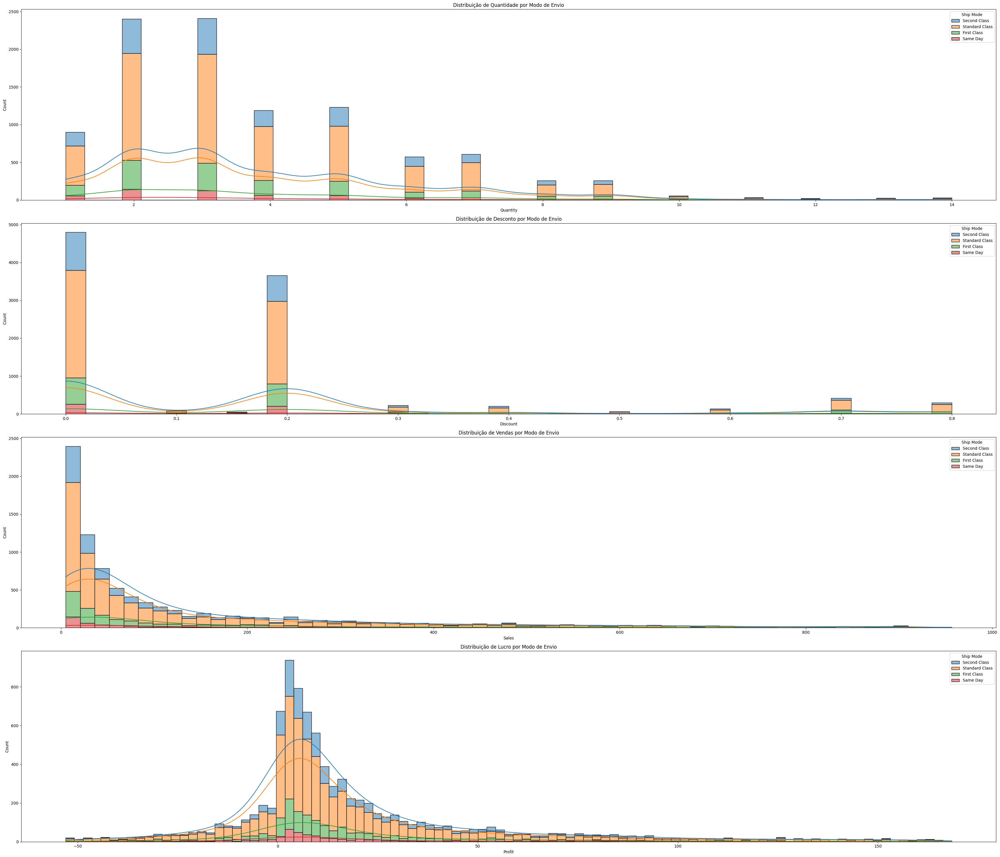

In [ ]:
plt.figure(figsize=(35, 30))

plt.subplot(4, 1, 1)
sns.histplot(data=df_store, x='Quantity', hue='Ship Mode', multiple="stack", kde=True)
plt.title('Distribuição de Quantidade por Modo de Envio')


plt.subplot(4, 1, 2)
sns.histplot(data=df_store, x='Discount', hue='Ship Mode', multiple="stack", kde=True)
plt.title('Distribuição de Desconto por Modo de Envio')


# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.histplot(data=sales_filtered, x='Sales', hue='Ship Mode', multiple="stack", kde=True)
plt.title('Distribuição de Vendas por Modo de Envio')


plt.subplot(4, 1, 4)
sns.histplot(data=profit_filtered, x='Profit', hue='Ship Mode', multiple="stack", kde=True)
plt.title('Distribuição de Lucro por Modo de Envio')

plt.tight_layout()
plt.show()


#### 4.1.1.2

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color='Ship Mode')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Modo de Envio")

# Mostrando o histograma
fig.show()

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color='Ship Mode')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Modo de Envio")

# Mostrando o histograma
fig.show()

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color='Ship Mode')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Modo de Envio")

# Mostrando o histograma
fig.show()


In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color='Ship Mode')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Modo de Envio")

# Mostrando o histograma
fig.show()


#### 4.1.1.3

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color="Ship Mode", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Modo de Envio")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color="Ship Mode", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Modo de Envio")


# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Ship Mode", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Modo de Envio")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [ ]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Ship Mode", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Modo de Envio")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma

fig.show()

#### 4.1.1.4

In [107]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Ship Mode", nbins=100, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [108]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Ship Mode", nbins=100, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

### 4.2

#### 4.2.1.1

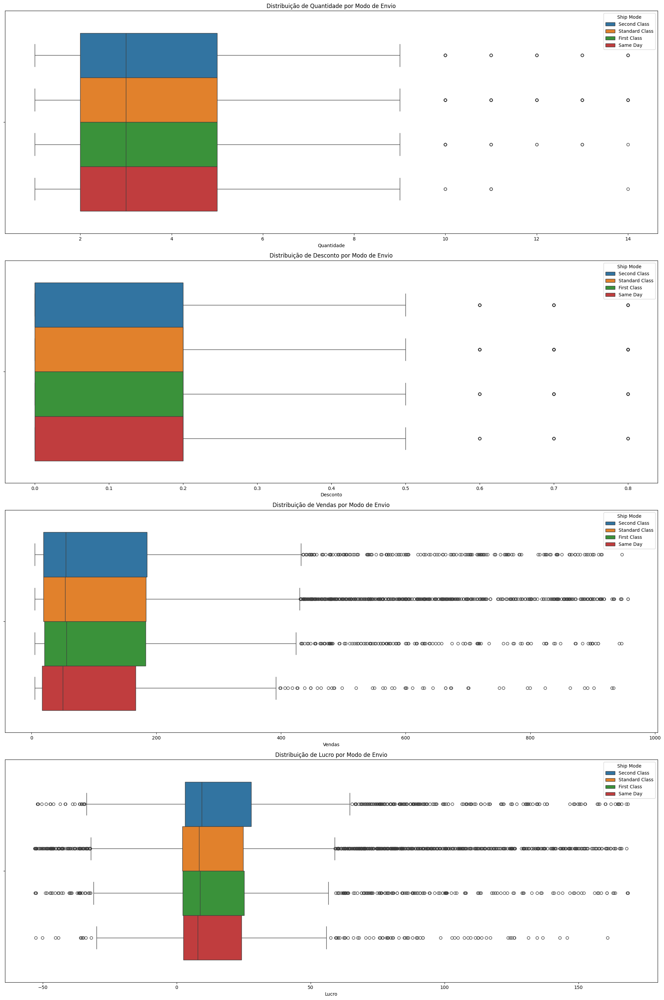

In [ ]:
plt.figure(figsize=(20, 30))

plt.subplot(4, 1, 1)
sns.boxplot(data=df_store, x="Quantity", hue="Ship Mode")
plt.title('Distribuição de Quantidade por Modo de Envio')
plt.xlabel('Quantidade')

plt.subplot(4, 1, 2)
sns.boxplot(data=df_store, x="Discount", hue="Ship Mode")
plt.title('Distribuição de Desconto por Modo de Envio')
plt.xlabel('Desconto')

# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.boxplot(data=sales_filtered, x="Sales", hue="Ship Mode")
plt.title('Distribuição de Vendas por Modo de Envio')
plt.xlabel('Vendas')

plt.subplot(4, 1, 4)
sns.boxplot(data=profit_filtered, x="Profit", hue="Ship Mode")
plt.title('Distribuição de Lucro por Modo de Envio')
plt.xlabel('Lucro')

plt.tight_layout()
plt.show()


#### 4.2.1.2

In [ ]:
fig = px.box(df_store, x="Quantity", color="Ship Mode")
fig.show()

In [ ]:
fig = px.box(df_store, x="Discount", color="Ship Mode")
fig.show()

In [ ]:
# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
fig = px.box(sales_filtered, x="Sales", color="Ship Mode")
fig.show()

In [ ]:
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]
fig = px.box(profit_filtered, x="Profit", color="Ship Mode")
fig.show()

### 4.3

#### 4.3.1

Text(0.5, 1.0, 'Same Day')

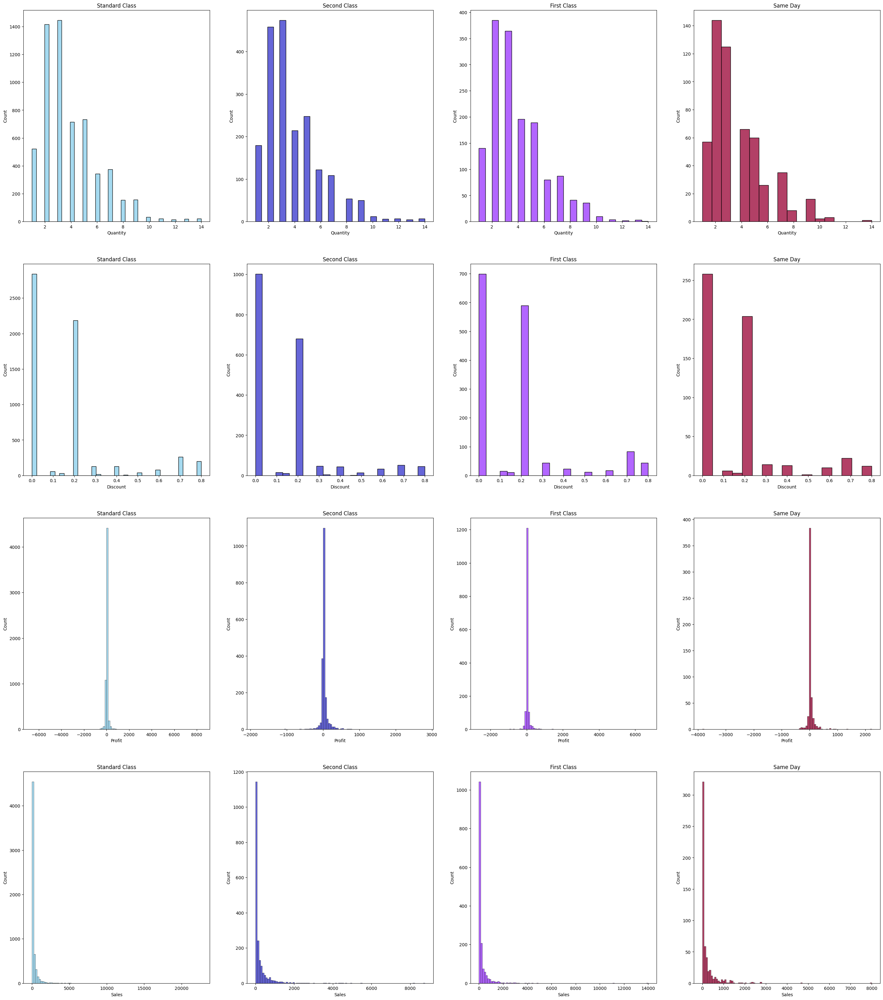

In [109]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 4, 1)
sns.histplot(df_store_standard['Quantity'], color='skyblue')
plt.title('Standard Class')
plt.subplot(4, 4, 2)
sns.histplot(df_store_second['Quantity'], color='#33c')
plt.title('Second Class')
plt.subplot(4, 4, 3)
sns.histplot(df_store_first['Quantity'], color='#93f')
plt.title('First Class')
plt.subplot(4, 4, 4)
sns.histplot(df_store_sday['Quantity'], color='#903f')
plt.title('Same Day')

#linha2
plt.subplot(4, 4, 5)
sns.histplot(df_store_standard['Discount'], color='skyblue')
plt.title('Standard Class')
plt.subplot(4, 4, 6)
sns.histplot(df_store_second['Discount'], color='#33c')
plt.title('Second Class')
plt.subplot(4, 4, 7)
sns.histplot(df_store_first['Discount'], color='#93f')
plt.title('First Class')
plt.subplot(4, 4, 8)
sns.histplot(df_store_sday['Discount'], color='#903f')
plt.title('Same Day')

#linha3
plt.subplot(4, 4, 9)
sns.histplot(df_store_standard['Profit'], color='skyblue', bins=100)
plt.title('Standard Class')
plt.subplot(4, 4, 10)
sns.histplot(df_store_second['Profit'], color='#33c', bins=100)
plt.title('Second Class')
plt.subplot(4, 4, 11)
sns.histplot(df_store_first['Profit'], color='#93f', bins=100)
plt.title('First Class')
plt.subplot(4, 4, 12)
sns.histplot(df_store_sday['Profit'], color='#903f', bins=100)
plt.title('Same Day')

#linha4
plt.subplot(4, 4, 13)
sns.histplot(df_store_standard['Sales'], color='skyblue', bins=100)
plt.title('Standard Class')
plt.subplot(4, 4, 14)
sns.histplot(df_store_second['Sales'], color='#33c', bins=100)
plt.title('Second Class')
plt.subplot(4, 4, 15)
sns.histplot(df_store_first['Sales'], color='#93f', bins=100)
plt.title('First Class')
plt.subplot(4, 4, 16)
sns.histplot(df_store_sday['Sales'], color='#903f', bins=100)
plt.title('Same Day')


#### 4.3.2

Text(0.5, 1.0, 'Same Day')

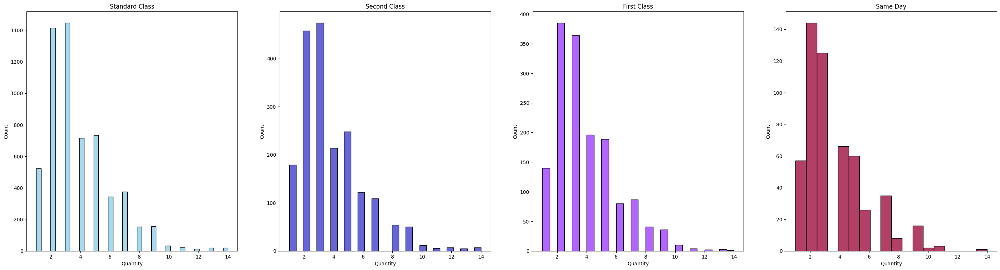

In [ ]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 4, 1)
sns.histplot(df_store_standard['Quantity'], color='skyblue')
plt.title('Standard Class')
plt.subplot(4, 4, 2)
sns.histplot(df_store_second['Quantity'], color='#33c')
plt.title('Second Class')
plt.subplot(4, 4, 3)
sns.histplot(df_store_first['Quantity'], color='#93f')
plt.title('First Class')
plt.subplot(4, 4, 4)
sns.histplot(df_store_sday['Quantity'], color='#903f')
plt.title('Same Day')


Text(0.5, 1.0, 'Same Day')

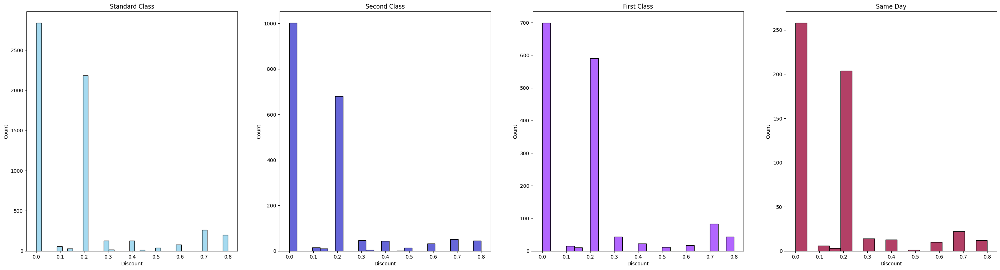

In [ ]:
#linha2
plt.figure(figsize=(35, 40))
plt.subplot(4, 4, 5)
sns.histplot(df_store_standard['Discount'], color='skyblue')
plt.title('Standard Class')
plt.subplot(4, 4, 6)
sns.histplot(df_store_second['Discount'], color='#33c')
plt.title('Second Class')
plt.subplot(4, 4, 7)
sns.histplot(df_store_first['Discount'], color='#93f')
plt.title('First Class')
plt.subplot(4, 4, 8)
sns.histplot(df_store_sday['Discount'], color='#903f')
plt.title('Same Day')

Text(0.5, 1.0, 'Same Day')

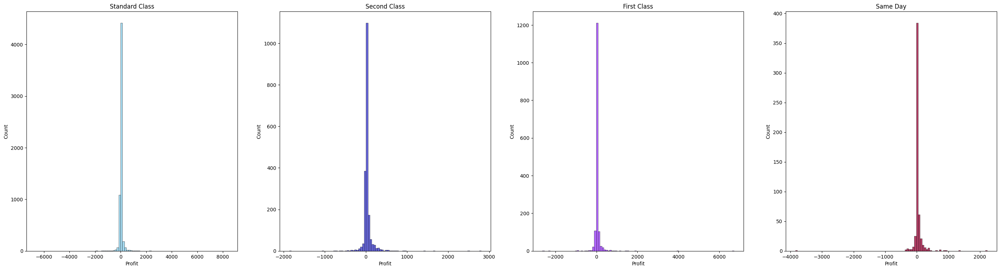

In [110]:
#linha3
plt.figure(figsize=(35, 40))
plt.subplot(4, 4, 9)
sns.histplot(df_store_standard['Profit'], color='skyblue', bins=100)
plt.title('Standard Class')
plt.subplot(4, 4, 10)
sns.histplot(df_store_second['Profit'], color='#33c', bins=100)
plt.title('Second Class')
plt.subplot(4, 4, 11)
sns.histplot(df_store_first['Profit'], color='#93f', bins=100)
plt.title('First Class')
plt.subplot(4, 4, 12)
sns.histplot(df_store_sday['Profit'], color='#903f', bins=100)
plt.title('Same Day')

Text(0.5, 1.0, 'Same Day')

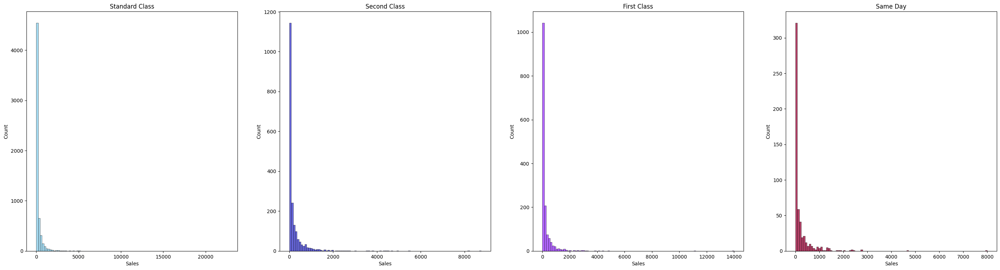

In [112]:
#linha4
plt.figure(figsize=(35, 40))
plt.subplot(4, 4, 13)
sns.histplot(df_store_standard['Sales'], color='skyblue', bins=100)
plt.title('Standard Class')
plt.subplot(4, 4, 14)
sns.histplot(df_store_second['Sales'], color='#33c', bins=100)
plt.title('Second Class')
plt.subplot(4, 4, 15)
sns.histplot(df_store_first['Sales'], color='#93f', bins=100)
plt.title('First Class')
plt.subplot(4, 4, 16)
sns.histplot(df_store_sday['Sales'], color='#903f', bins=100)
plt.title('Same Day')

## Segment

### 4.1

#### 4.1.1.1

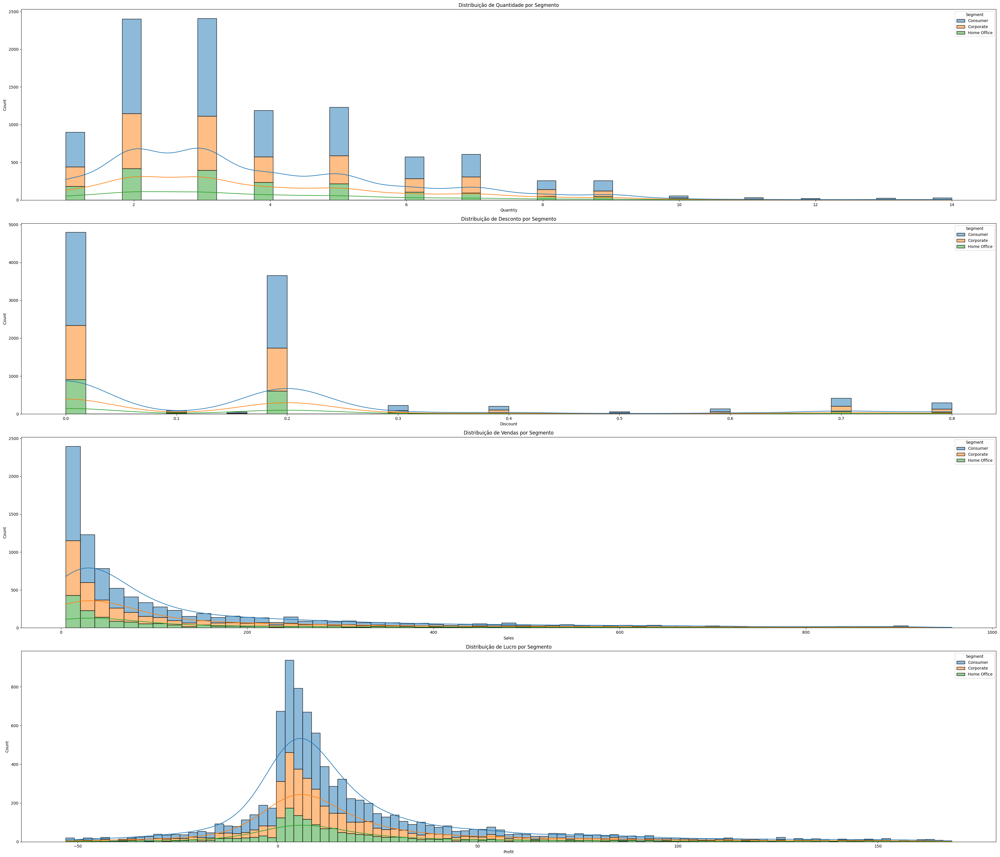

In [72]:
plt.figure(figsize=(35, 30))

plt.subplot(4, 1, 1)
sns.histplot(data=df_store, x='Quantity', hue='Segment', multiple="stack", kde=True)
plt.title('Distribuição de Quantidade por Segmento')


plt.subplot(4, 1, 2)
sns.histplot(data=df_store, x='Discount', hue='Segment', multiple="stack", kde=True)
plt.title('Distribuição de Desconto por Segmento')


# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.histplot(data=sales_filtered, x='Sales', hue='Segment', multiple="stack", kde=True)
plt.title('Distribuição de Vendas por Segmento')


plt.subplot(4, 1, 4)
sns.histplot(data=profit_filtered, x='Profit', hue='Segment', multiple="stack", kde=True)
plt.title('Distribuição de Lucro por Segmento')

plt.tight_layout()
plt.show()


#### 4.1.1.2

In [73]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color='Segment')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Segmento")

# Mostrando o histograma
fig.show()

In [74]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color='Segment')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Segmento")

# Mostrando o histograma
fig.show()

In [75]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color='Segment')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Segmento")

# Mostrando o histograma
fig.show()


In [76]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color='Segment')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Segmento")

# Mostrando o histograma
fig.show()


#### 4.1.1.3

In [77]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color="Segment", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Segmento")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [78]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color="Segment", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Segmento")


# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [79]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Segment", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Segmento")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [80]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Segment", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Segmento")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma

fig.show()

#### 4.1.1.4

In [128]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Segment", nbins=200, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [129]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Segment", nbins=200, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

### 4.2

#### 4.2.1.1

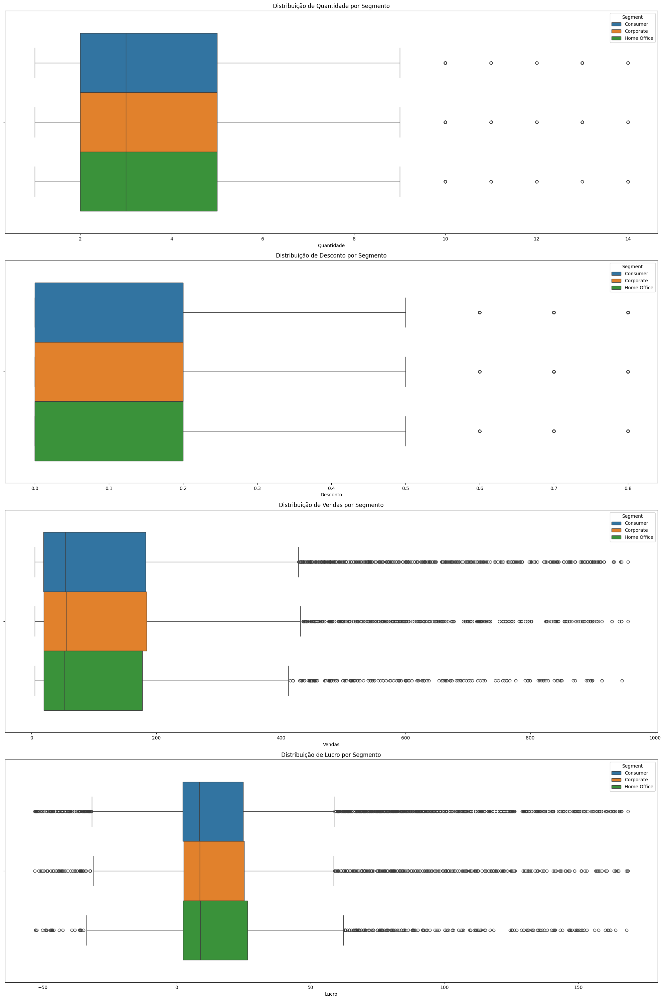

In [83]:
plt.figure(figsize=(20, 30))

plt.subplot(4, 1, 1)
sns.boxplot(data=df_store, x="Quantity", hue="Segment")
plt.title('Distribuição de Quantidade por Segmento')
plt.xlabel('Quantidade')

plt.subplot(4, 1, 2)
sns.boxplot(data=df_store, x="Discount", hue="Segment")
plt.title('Distribuição de Desconto por Segmento')
plt.xlabel('Desconto')

# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.boxplot(data=sales_filtered, x="Sales", hue="Segment")
plt.title('Distribuição de Vendas por Segmento')
plt.xlabel('Vendas')

plt.subplot(4, 1, 4)
sns.boxplot(data=profit_filtered, x="Profit", hue="Segment")
plt.title('Distribuição de Lucro por Segmento')
plt.xlabel('Lucro')

plt.tight_layout()
plt.show()


#### 4.2.1.2

In [85]:
fig = px.box(df_store, x="Quantity", color="Segment")
fig.show()

In [86]:
fig = px.box(df_store, x="Discount", color="Segment")
fig.show()

In [91]:
# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
fig = px.box(sales_filtered, x="Sales", color="Segment")
fig.show()

In [92]:
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]
fig = px.box(profit_filtered, x="Profit", color="Segment")
fig.show()

### 4.3

#### 4.3.1

Text(0.5, 1.0, 'Home Office')

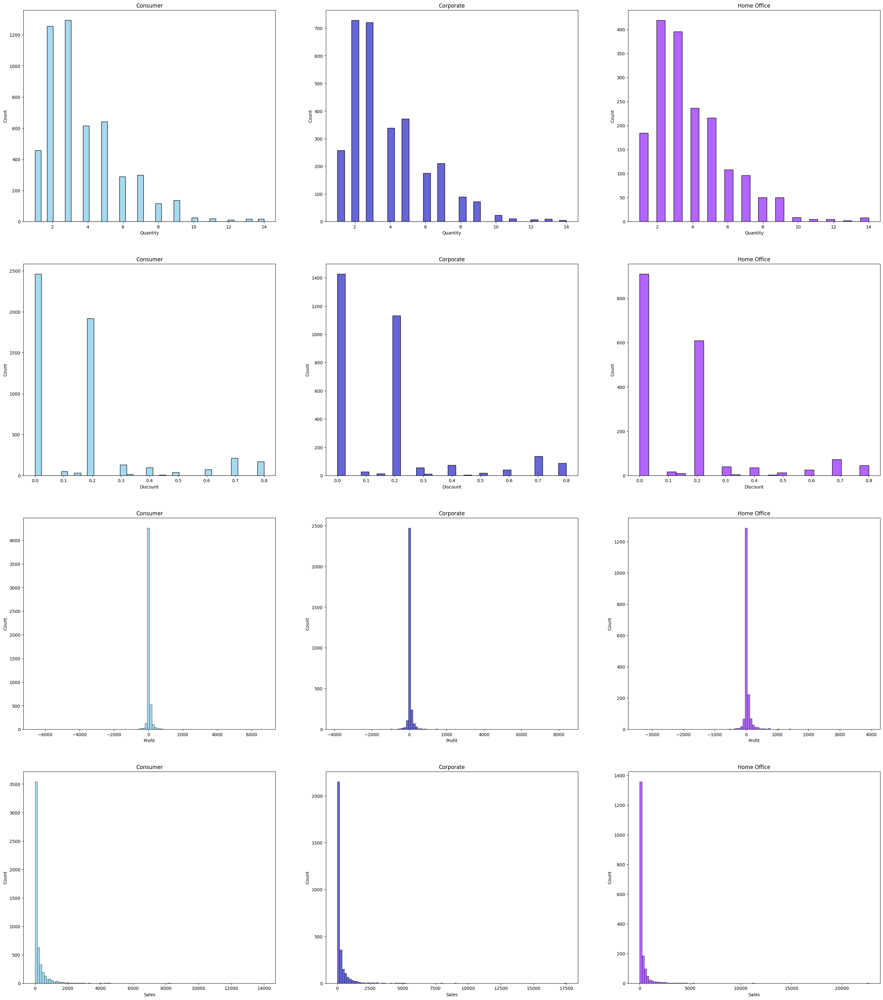

In [104]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 1)
sns.histplot(df_store_consumer['Quantity'], color='skyblue')
plt.title('Consumer')
plt.subplot(4, 3, 2)
sns.histplot(df_store_corporate['Quantity'], color='#33c')
plt.title('Corporate')
plt.subplot(4, 3, 3)
sns.histplot(df_store_hoffice['Quantity'], color='#93f')
plt.title('Home Office')

#linha2
plt.subplot(4, 3, 4)
sns.histplot(df_store_consumer['Discount'], color='skyblue')
plt.title('Consumer')
plt.subplot(4, 3, 5)
sns.histplot(df_store_corporate['Discount'], color='#33c')
plt.title('Corporate')
plt.subplot(4, 3, 6)
sns.histplot(df_store_hoffice['Discount'], color='#93f')
plt.title('Home Office')

#linha3
plt.subplot(4, 3, 7)
sns.histplot(df_store_consumer['Profit'], color='skyblue', bins=100)
plt.title('Consumer')
plt.subplot(4, 3, 8)
sns.histplot(df_store_corporate['Profit'], color='#33c', bins=100)
plt.title('Corporate')
plt.subplot(4, 3, 9)
sns.histplot(df_store_hoffice['Profit'], color='#93f', bins=100)
plt.title('Home Office')

#linha4
plt.subplot(4, 3, 10)
sns.histplot(df_store_consumer['Sales'], color='skyblue', bins=100)
plt.title('Consumer')
plt.subplot(4, 3, 11)
sns.histplot(df_store_corporate['Sales'], color='#33c', bins=100)
plt.title('Corporate')
plt.subplot(4, 3, 12)
sns.histplot(df_store_hoffice['Sales'], color='#93f', bins=100)
plt.title('Home Office')


#### 4.3.2

Text(0.5, 1.0, 'Home Office')

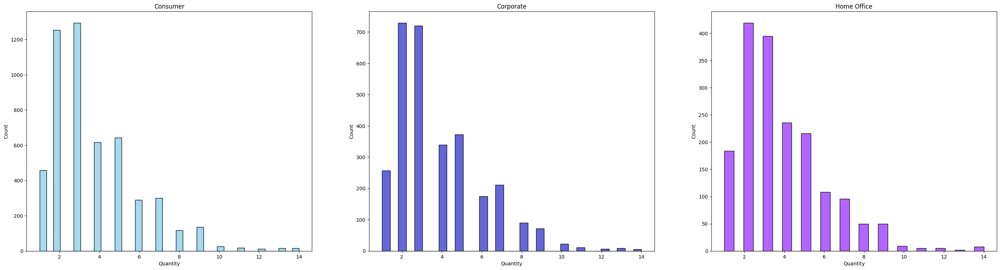

In [96]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 1)
sns.histplot(df_store_consumer['Quantity'], color='skyblue')
plt.title('Consumer')
plt.subplot(4, 3, 2)
sns.histplot(df_store_corporate['Quantity'], color='#33c')
plt.title('Corporate')
plt.subplot(4, 3, 3)
sns.histplot(df_store_hoffice['Quantity'], color='#93f')
plt.title('Home Office')

Text(0.5, 1.0, 'Home Office')

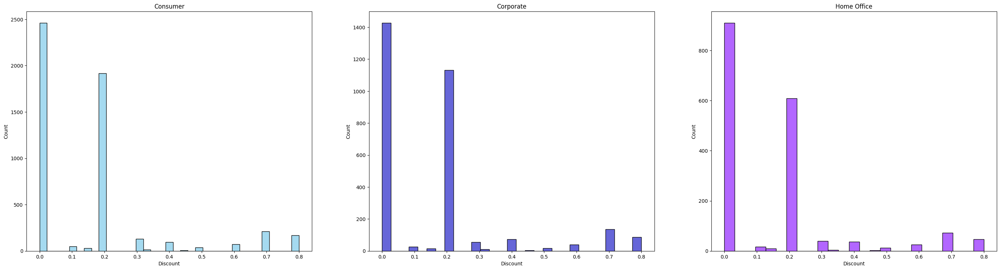

In [97]:
#linha2
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 4)
sns.histplot(df_store_consumer['Discount'], color='skyblue')
plt.title('Consumer')
plt.subplot(4, 3, 5)
sns.histplot(df_store_corporate['Discount'], color='#33c')
plt.title('Corporate')
plt.subplot(4, 3, 6)
sns.histplot(df_store_hoffice['Discount'], color='#93f')
plt.title('Home Office')

Text(0.5, 1.0, 'Home Office')

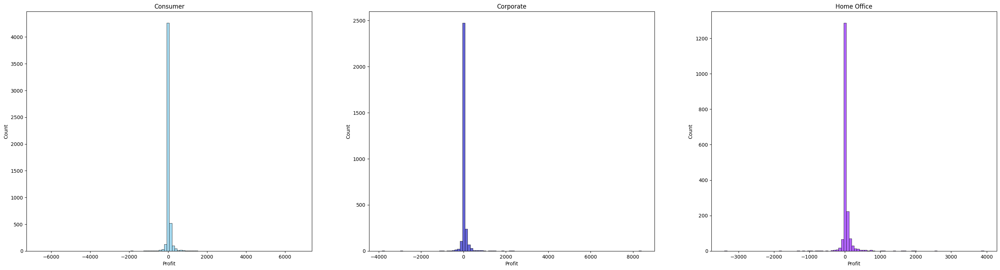

In [103]:
#linha3
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 7)
sns.histplot(df_store_consumer['Profit'], color='skyblue', bins=100)
plt.title('Consumer')
plt.subplot(4, 3, 8)
sns.histplot(df_store_corporate['Profit'], color='#33c', bins=100)
plt.title('Corporate')
plt.subplot(4, 3, 9)
sns.histplot(df_store_hoffice['Profit'], color='#93f', bins=100)
plt.title('Home Office')

Text(0.5, 1.0, 'Home Office')

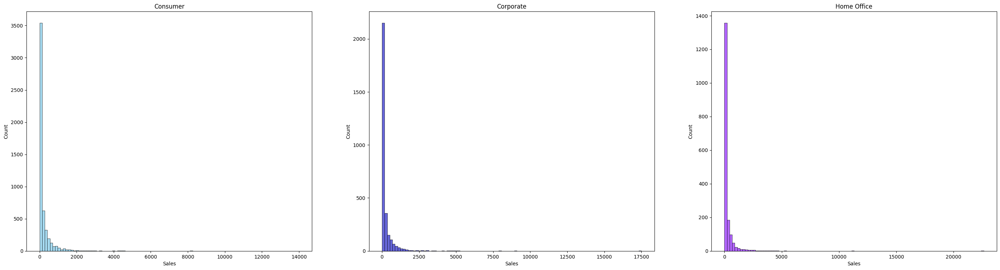

In [102]:
#linha4
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 10)
sns.histplot(df_store_consumer['Sales'], color='skyblue', bins=100)
plt.title('Consumer')
plt.subplot(4, 3, 11)
sns.histplot(df_store_corporate['Sales'], color='#33c', bins=100)
plt.title('Corporate')
plt.subplot(4, 3, 12)
sns.histplot(df_store_hoffice['Sales'], color='#93f', bins=100)
plt.title('Home Office')

## Category

### 4.1

#### 4.1.1.1

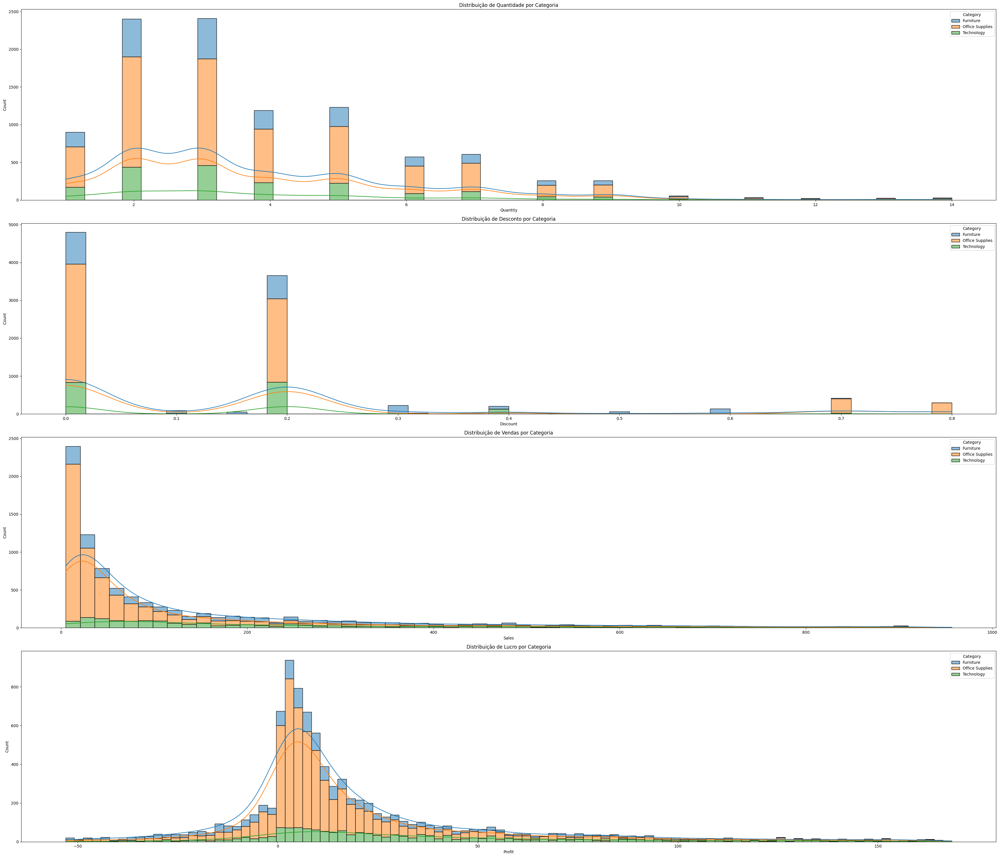

In [137]:
plt.figure(figsize=(35, 30))

plt.subplot(4, 1, 1)
sns.histplot(data=df_store, x='Quantity', hue='Category', multiple="stack", kde=True)
plt.title('Distribuição de Quantidade por Categoria')


plt.subplot(4, 1, 2)
sns.histplot(data=df_store, x='Discount', hue='Category', multiple="stack", kde=True)
plt.title('Distribuição de Desconto por Categoria')


# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.histplot(data=sales_filtered, x='Sales', hue='Category', multiple="stack", kde=True)
plt.title('Distribuição de Vendas por Categoria')


plt.subplot(4, 1, 4)
sns.histplot(data=profit_filtered, x='Profit', hue='Category', multiple="stack", kde=True)
plt.title('Distribuição de Lucro por Categoria')

plt.tight_layout()
plt.show()


#### 4.1.1.2

In [138]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color='Category')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Categoria")

# Mostrando o histograma
fig.show()

In [139]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color='Category')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Categoria")

# Mostrando o histograma
fig.show()

In [140]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color='Category')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Categoria")

# Mostrando o histograma
fig.show()


In [142]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color='Category')

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5
    
# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Categoria")

# Mostrando o histograma
fig.show()


#### 4.1.1.3

In [143]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Quantity", color="Category", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Quantidade por Categoria")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [144]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Discount", color="Category", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Desconto por Categoria")


# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [145]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Category", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Vendas por Categoria")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [146]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Category", log_y=True)

# Adicionando um título ao layout
fig.update_layout(title="Distribuição de Lucro por Categoria")

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma

fig.show()

#### 4.1.1.4

In [151]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Sales", color="Category", nbins=100, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

In [152]:
# Criando o histograma com Plotly Express
fig = px.histogram(data_frame=df_store, x="Profit", color="Category", nbins=100, log_y=True)

# Ajustando a largura da borda
for trace in fig.data:
    trace.marker.line.width = 0.5

# Mostrando o histograma
fig.show()

### 4.2

#### 4.2.1.1

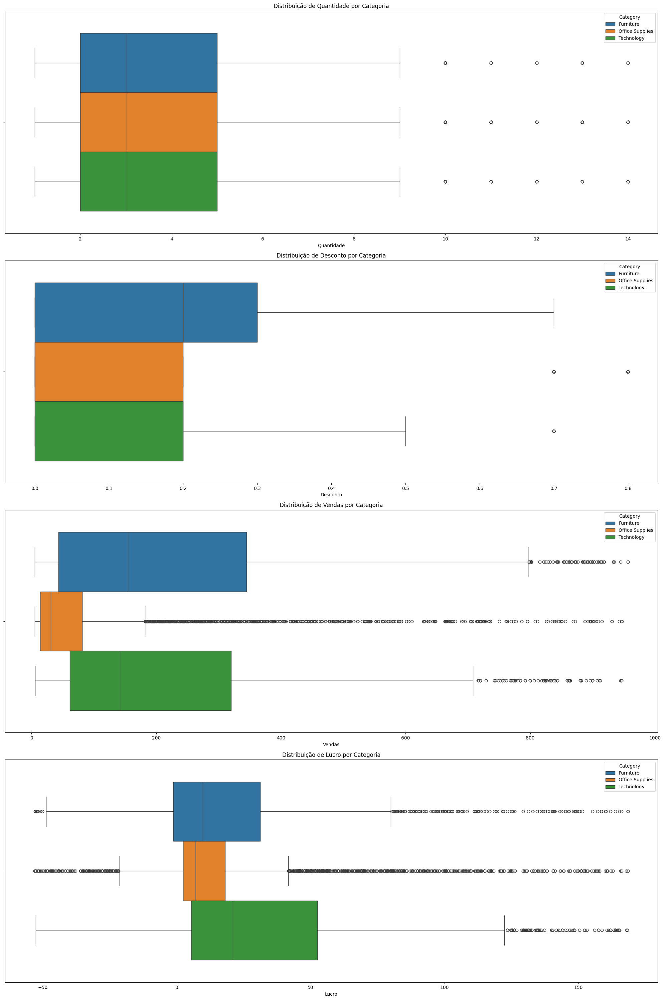

In [153]:
plt.figure(figsize=(20, 30))

plt.subplot(4, 1, 1)
sns.boxplot(data=df_store, x="Quantity", hue="Category")
plt.title('Distribuição de Quantidade por Categoria')
plt.xlabel('Quantidade')

plt.subplot(4, 1, 2)
sns.boxplot(data=df_store, x="Discount", hue="Category")
plt.title('Distribuição de Desconto por Categoria')
plt.xlabel('Desconto')

# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]

plt.subplot(4, 1, 3)
sns.boxplot(data=sales_filtered, x="Sales", hue="Category")
plt.title('Distribuição de Vendas por Categoria')
plt.xlabel('Vendas')

plt.subplot(4, 1, 4)
sns.boxplot(data=profit_filtered, x="Profit", hue="Category")
plt.title('Distribuição de Lucro por Categoria')
plt.xlabel('Lucro')

plt.tight_layout()
plt.show()


#### 4.2.1.2

In [159]:
fig = px.box(df_store, x="Quantity", color="Category")
fig.show()

In [160]:
fig = px.box(df_store, x="Discount", color="Category")
fig.show()

In [161]:
# Limitando a faixa dos dados exibidos para Sales e Profit
sales_filtered = df_store[df_store['Sales'].between(df_store['Sales'].quantile(0.05), df_store['Sales'].quantile(0.95))]
fig = px.box(sales_filtered, x="Sales", color="Category")
fig.show()

In [162]:
profit_filtered = df_store[df_store['Profit'].between(df_store['Profit'].quantile(0.05), df_store['Profit'].quantile(0.95))]
fig = px.box(profit_filtered, x="Profit", color="Category")
fig.show()

### 4.3

#### 4.3.1

Text(0.5, 1.0, 'Office Supplies')

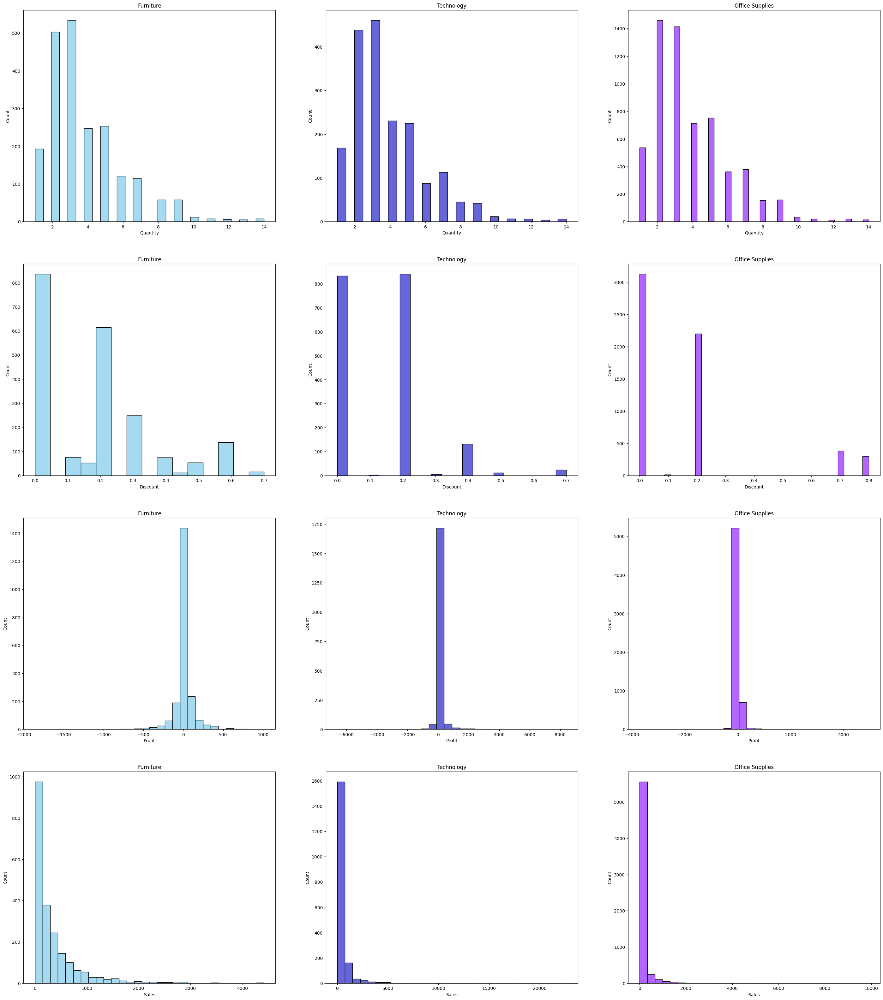

In [164]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 1)
sns.histplot(df_store_furniture['Quantity'], color='skyblue')
plt.title('Furniture')
plt.subplot(4, 3, 2)
sns.histplot(df_store_technology['Quantity'], color='#33c')
plt.title('Technology')
plt.subplot(4, 3, 3)
sns.histplot(df_store_officesupli['Quantity'], color='#93f')
plt.title('Office Supplies')

#linha2
plt.subplot(4, 3, 4)
sns.histplot(df_store_furniture['Discount'], color='skyblue')
plt.title('Furniture')
plt.subplot(4, 3, 5)
sns.histplot(df_store_technology['Discount'], color='#33c')
plt.title('Technology')
plt.subplot(4, 3, 6)
sns.histplot(df_store_officesupli['Discount'], color='#93f')
plt.title('Office Supplies')

#linha3
plt.subplot(4, 3, 7)
sns.histplot(df_store_furniture['Profit'], color='skyblue', bins=30)
plt.title('Furniture')
plt.subplot(4, 3, 8)
sns.histplot(df_store_technology['Profit'], color='#33c', bins=30)
plt.title('Technology')
plt.subplot(4, 3, 9)
sns.histplot(df_store_officesupli['Profit'], color='#93f', bins=30)
plt.title('Office Supplies')

#linha4
plt.subplot(4, 3, 10)
sns.histplot(df_store_furniture['Sales'], color='skyblue', bins=30)
plt.title('Furniture')
plt.subplot(4, 3, 11)
sns.histplot(df_store_technology['Sales'], color='#33c', bins=30)
plt.title('Technology')
plt.subplot(4, 3, 12)
sns.histplot(df_store_officesupli['Sales'], color='#93f', bins=30)
plt.title('Office Supplies')

#### 4.3.2

Text(0.5, 1.0, 'Office Supplies')

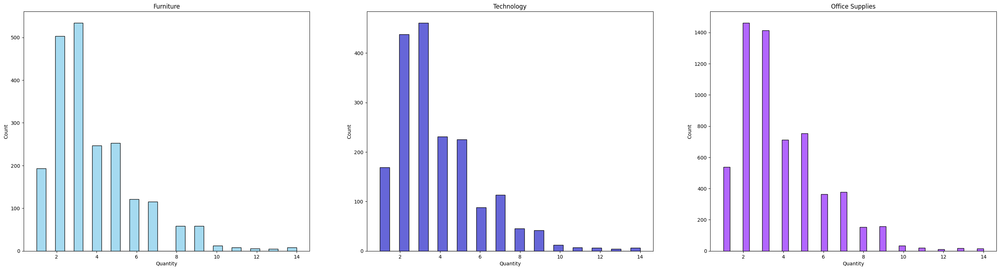

In [165]:
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 1)
sns.histplot(df_store_furniture['Quantity'], color='skyblue')
plt.title('Furniture')
plt.subplot(4, 3, 2)
sns.histplot(df_store_technology['Quantity'], color='#33c')
plt.title('Technology')
plt.subplot(4, 3, 3)
sns.histplot(df_store_officesupli['Quantity'], color='#93f')
plt.title('Office Supplies')

Text(0.5, 1.0, 'Office Supplies')

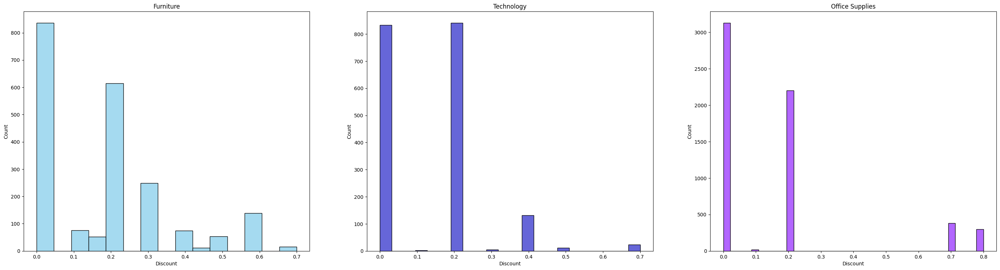

In [166]:
#linha2
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 4)
sns.histplot(df_store_furniture['Discount'], color='skyblue')
plt.title('Furniture')
plt.subplot(4, 3, 5)
sns.histplot(df_store_technology['Discount'], color='#33c')
plt.title('Technology')
plt.subplot(4, 3, 6)
sns.histplot(df_store_officesupli['Discount'], color='#93f')
plt.title('Office Supplies')

Text(0.5, 1.0, 'Office Supplies')

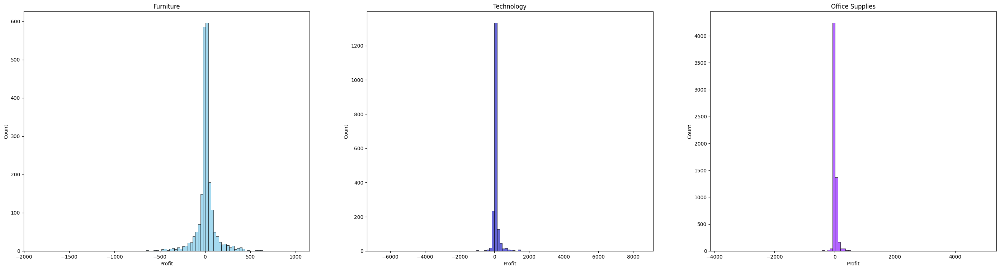

In [169]:
#linha3
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 7)
sns.histplot(df_store_furniture['Profit'], color='skyblue', bins=100)
plt.title('Furniture')
plt.subplot(4, 3, 8)
sns.histplot(df_store_technology['Profit'], color='#33c', bins=100)
plt.title('Technology')
plt.subplot(4, 3, 9)
sns.histplot(df_store_officesupli['Profit'], color='#93f', bins=100)
plt.title('Office Supplies')

Text(0.5, 1.0, 'Office Supplies')

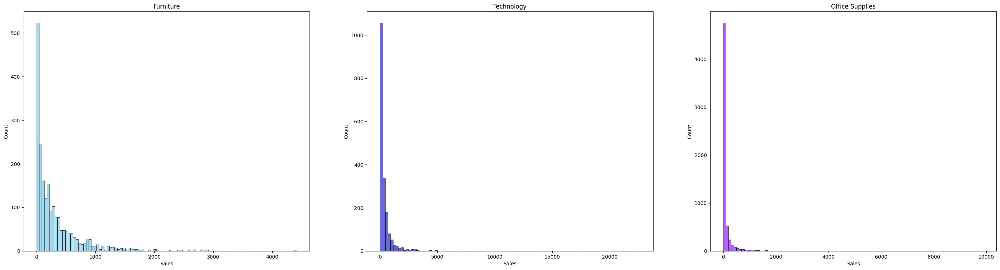

In [170]:
#linha4
plt.figure(figsize=(35, 40))
plt.subplot(4, 3, 10)
sns.histplot(df_store_furniture['Sales'], color='skyblue', bins=100)
plt.title('Furniture')
plt.subplot(4, 3, 11)
sns.histplot(df_store_technology['Sales'], color='#33c', bins=100)
plt.title('Technology')
plt.subplot(4, 3, 12)
sns.histplot(df_store_officesupli['Sales'], color='#93f', bins=100)
plt.title('Office Supplies')

# 4.3 (Alternativo)